## 노래별 감정 단어 워드클라우드로 시각화하기

In [1]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import pandas as pd
text = pd.read_excel('./Video_with_Emotional_Words_Melon.xlsx')

In [2]:
text

,Song Title,Site Link,Emotional Words
0,미쳐,https://www.melon.com/song/detail.htm?songId=5...,"['미쳐가는', '미친', '미쳐가는', '미친', '미쳐가는', '미친', '찰짐..."
1,Badboy,https://www.melon.com/song/detail.htm?songId=3...,"['미쳐', '좋음', '미치게', '미친', '좋고', '좋았음', '예쁨', '..."
2,HIP,https://www.melon.com/song/detail.htm?songId=3...,"['좋다', '좋다', '미쳤어', '좋다', '좋다', '미쳤어', '좋다', '..."
3,DUN DUN,https://www.melon.com/song/detail.htm?songId=3...,"['좋네', '비슷하긴한데', '좋네', '비슷하긴한데', '좋네', '비슷하긴한데..."
4,How You Like That,https://www.melon.com/song/detail.htm?songId=3...,"['좋음', '좋겠다는', '좋다', '미쳤냐', '좋음', '좋겠다는', '좋다'..."
5,TT,https://www.melon.com/song/detail.htm?songId=3...,"['열광하던', '열광하던', '열광하던', '설렌다', '신기한', '좋으니까',..."
6,뿜뿜,https://www.melon.com/song/detail.htm?songId=3...,"['신나는', '예뻐서', '좋아했던', '설렘', '좋음', '좋다', '좋고',..."
7,롤린,https://www.melon.com/song/detail.htm?songId=3...,"['좋아라', '좋아할거', '싫어요', '좋음', '좋아라', '좋아할거', '싫..."
8,Alcohol-Free,https://www.melon.com/song/detail.htm?songId=3...,"['많은것도', '사랑스러운건', '좋아서', '예쁨', '궁금한', '좋은데', ..."
9,DunDun Dance,https://www.melon.com/song/detail.htm?songId=3...,"['좋아요', '경쾌해', '완벽해요', '사랑스러요', '좋네요', '미쳤어', ..."


In [3]:
# 너무 자주 등장하는데 필요없는 단어 '좋다', '싫다', '있다', '없다' '이런', '저런' 모음 만들어서 현재 리스트에서 삭제
# bad_word 리스트에 저장
first = ['좋', '싫', '있', '없', '이', '저', '조', '시', '같', '다르', '젛', '실', '안', '던던', '중요', '가능', '꾸준', '아닌', '아니', '맞', '비슷', '상관', '아니', '너무', '높', '낮', '부탁', '요청', '사정', '그', '똑같', '그러', '이러', '저러', '미안', '미', '죄송', '감사', '많', '적', '상당', '충분', '죽', '살', '사랑']
last = ['', '아', '어', '다', '네', '네요', '당', '아라', '음', '고', '노', '댜', '아요', '아하네', '어하네', '고여', '고요', '아합니다', '어합니다', '어요', '런', '런거', '런게', '을텐데', '군', '냐고', '냐', '구', '아용', '아랑', '은데', '앙', '아행', '엉', '운뎅', '은뎅', '군요', '구먼', '으니까', '어서', '음요', '기만', '지만', '으나', '으면', '움', '러', '러용', '아유', '어유', '군여', '아하는', '어하는', '아하더라', '어하더라', '아하는데', '어하는데', '아하는지', '야', '아했나봐', '하네', '하네요', '다용', '하고요', '아용', '아욘', '아욤',
       '어하는지', '아하고', '어하고', '렇게는', '렇게도', '렇게나', '다고', '다는', '다네', '다니', '다니까', '렇다니까', '렇다니', '그러니', '그러니까', '은', '음요', '은디', '아서', '아할게', '어서', '어할게', '아했는데', '어했는데', '길', '기를', '기', '아할거', '아할거야', '어할거야', '아한다', '어한다', '아한댜', '어한댜', '을텐데', '럴텐데', '렇게', '로케', '된다', '됩니다', '해요', '해유', '히', '더러', '런게', '러노', '거', '가', '나', '다', '라', '하', '으시고', '아하시고', '아했지만', '한데', '한데요', '다요', '하고', '어용', '어욘', '어욤', '쥬', ''
       '더라', '하긴한데', '없긴', '없긴한데', '였어', '었어', '였음', '었음', '였다니', '었다니', '했다니', '했다는', '했다', '해', '겠어요', '겠다', '겠어', '다는걸', '다는뎅', '다는데', '아하는데요', '겠당', '다능', '다는', '앗는데', '앗음', '앗다', '앗다는', '으니까', '당', '나요', '드림', '이', '이니', '이군', '이군요', '음', '은데', '하네', '한게', '하네요', '는데', '는데요', '럴', '렇', '럴까', '럴까요', '아할까요', '어할까요', '지', '지요', '을', '을까', '을까요', '지용', '을것', '을것이', '야', '았어요', '었어요', '았어용', '었어용', '죠', '져용', '져요']

bad_word = []

for i in first:
    for j in last:
        bad_word.append(i+j)

In [4]:
# 필요 없는 기호, 개행문자 삭제
for i in range(len(text.iloc[:, 2])):
    text.iloc[:, 2][i] = text.iloc[:, 2][i].replace('[', '').replace(']', '').replace("'", '').replace('\n', '') 
    text.iloc[:, 2][i] = text.iloc[:, 2][i].split(', ')

In [5]:
text

,Song Title,Site Link,Emotional Words
0,미쳐,https://www.melon.com/song/detail.htm?songId=5...,"[미쳐가는, 미친, 미쳐가는, 미친, 미쳐가는, 미친, 찰짐, 세련되고, 좋다, 좋..."
1,Badboy,https://www.melon.com/song/detail.htm?songId=3...,"[미쳐, 좋음, 미치게, 미친, 좋고, 좋았음, 예쁨, 미쳐, 좋음, 미치게, 미친..."
2,HIP,https://www.melon.com/song/detail.htm?songId=3...,"[좋다, 좋다, 미쳤어, 좋다, 좋다, 미쳤어, 좋다, 좋다, 미쳤어, 재밌고, 리..."
3,DUN DUN,https://www.melon.com/song/detail.htm?songId=3...,"[좋네, 비슷하긴한데, 좋네, 비슷하긴한데, 좋네, 비슷하긴한데, 좋을텐데, 교묘하..."
4,How You Like That,https://www.melon.com/song/detail.htm?songId=3...,"[좋음, 좋겠다는, 좋다, 미쳤냐, 좋음, 좋겠다는, 좋다, 미쳤냐, 좋음, 좋겠다..."
5,TT,https://www.melon.com/song/detail.htm?songId=3...,"[열광하던, 열광하던, 열광하던, 설렌다, 신기한, 좋으니까, 괴로워도, 고픔, 귀..."
6,뿜뿜,https://www.melon.com/song/detail.htm?songId=3...,"[신나는, 예뻐서, 좋아했던, 설렘, 좋음, 좋다, 좋고, 좋고, 신나는, 예뻐서,..."
7,롤린,https://www.melon.com/song/detail.htm?songId=3...,"[좋아라, 좋아할거, 싫어요, 좋음, 좋아라, 좋아할거, 싫어요, 좋음, 좋아라, ..."
8,Alcohol-Free,https://www.melon.com/song/detail.htm?songId=3...,"[많은것도, 사랑스러운건, 좋아서, 예쁨, 궁금한, 좋은데, 부드럽게, 좋았을텐데,..."
9,DunDun Dance,https://www.melon.com/song/detail.htm?songId=3...,"[좋아요, 경쾌해, 완벽해요, 사랑스러요, 좋네요, 미쳤어, 미쳤어, 좋아요, 경쾌..."


In [6]:
# 현재 데이터프레임에 있는 단어가 bad_word 에 있으면 삭제
for i in range(len(text.iloc[:, 2])):
    for j in range(len(text.iloc[:, 2][i])):
        if text.iloc[:, 2][i][j] in bad_word:
            text.iloc[:, 2][i][j] = text.iloc[:, 2][i][j].replace(text.iloc[:, 2][i][j], '')

In [7]:
# ' 기호 삭제
for i in range(len(text.iloc[:, 2])):
    text.iloc[:, 2][i] = str(text.iloc[:, 2][i]).replace("'", '')

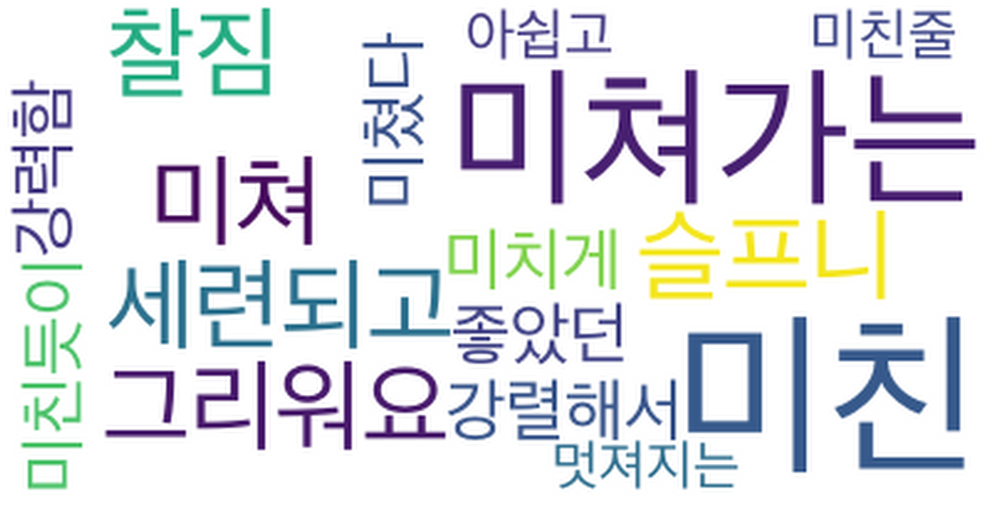

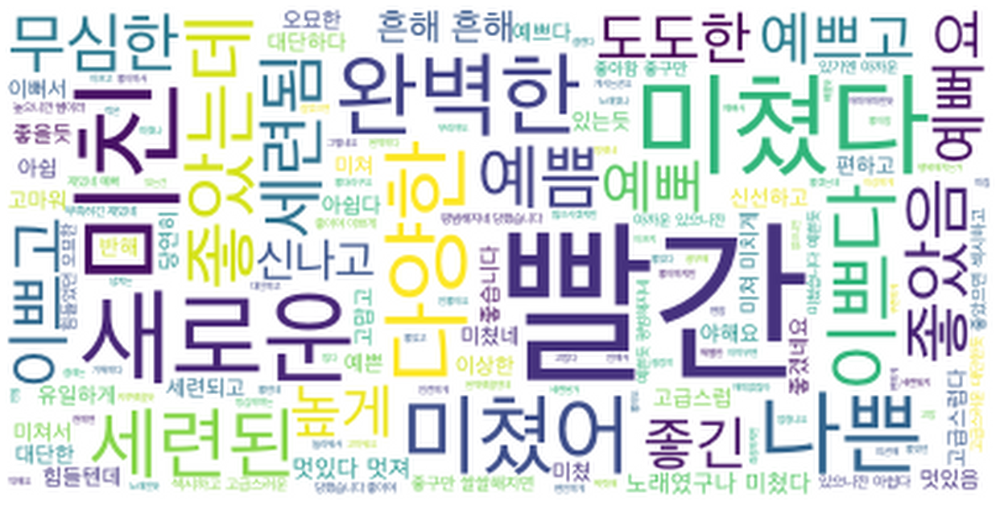

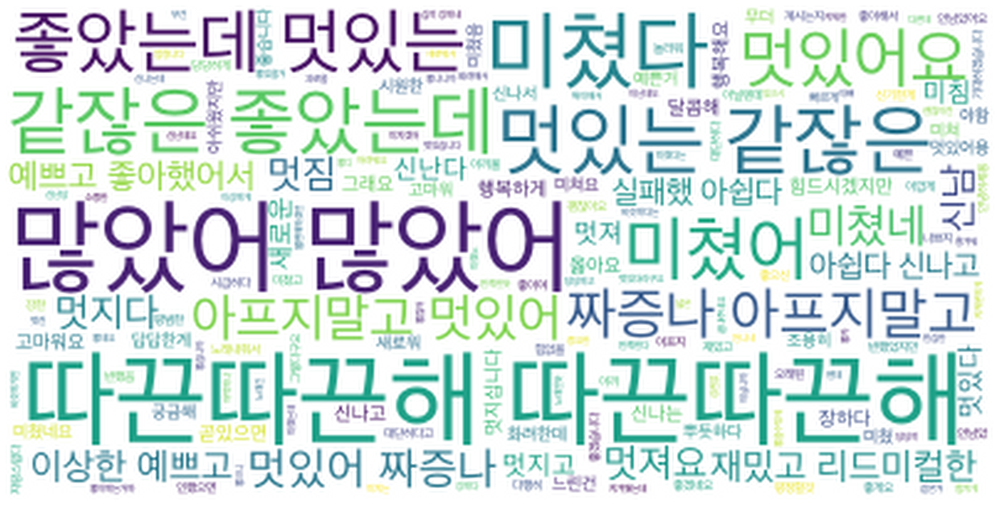

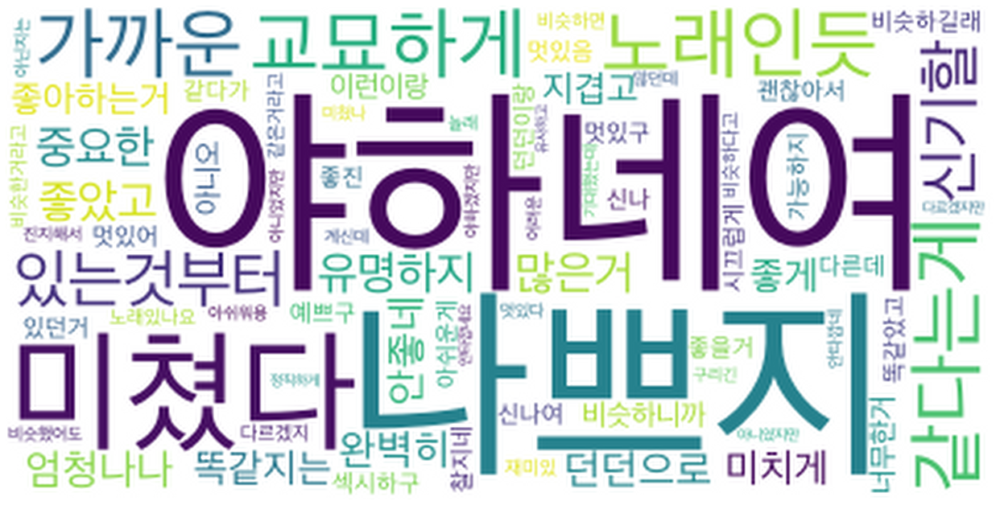

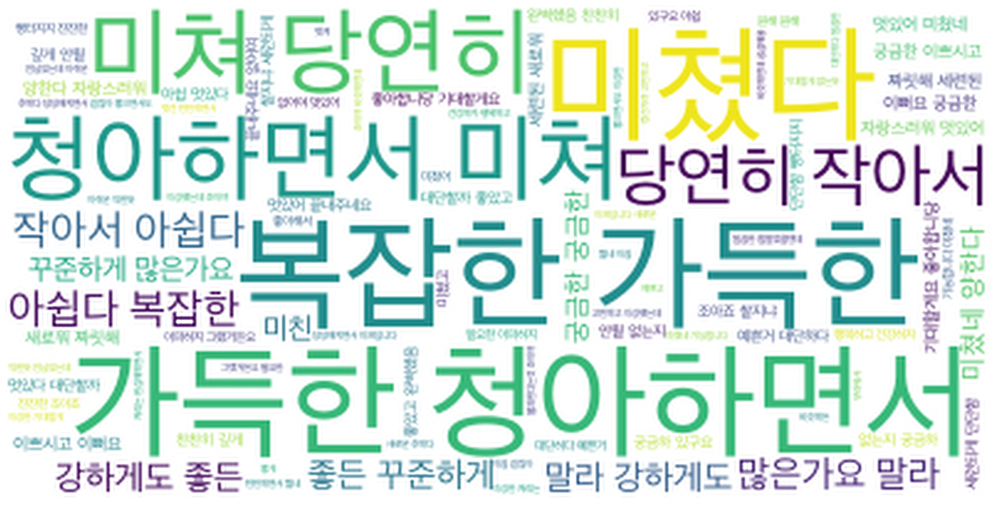

...

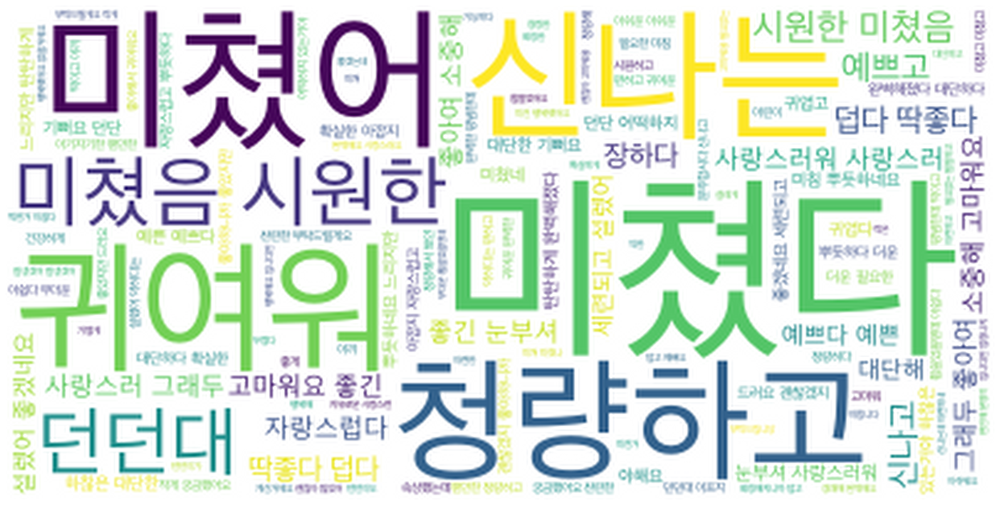

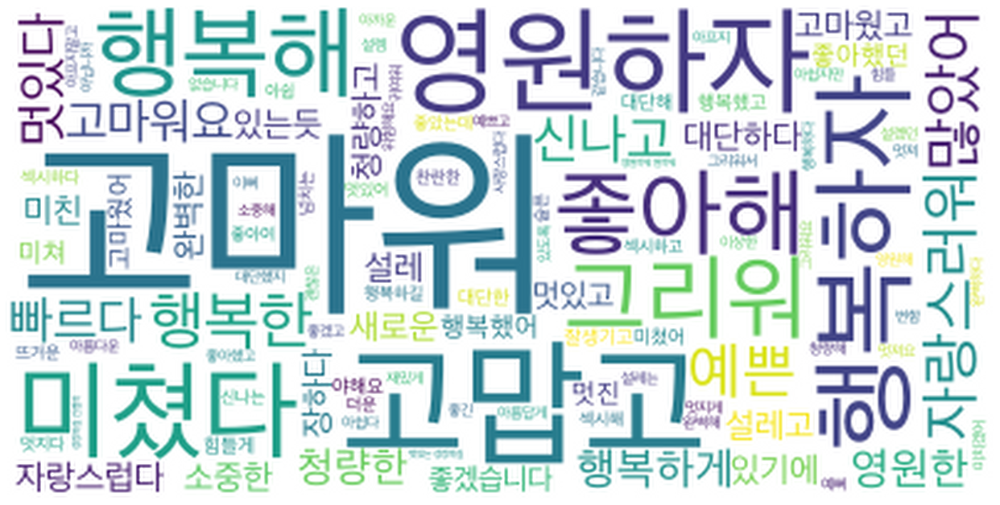

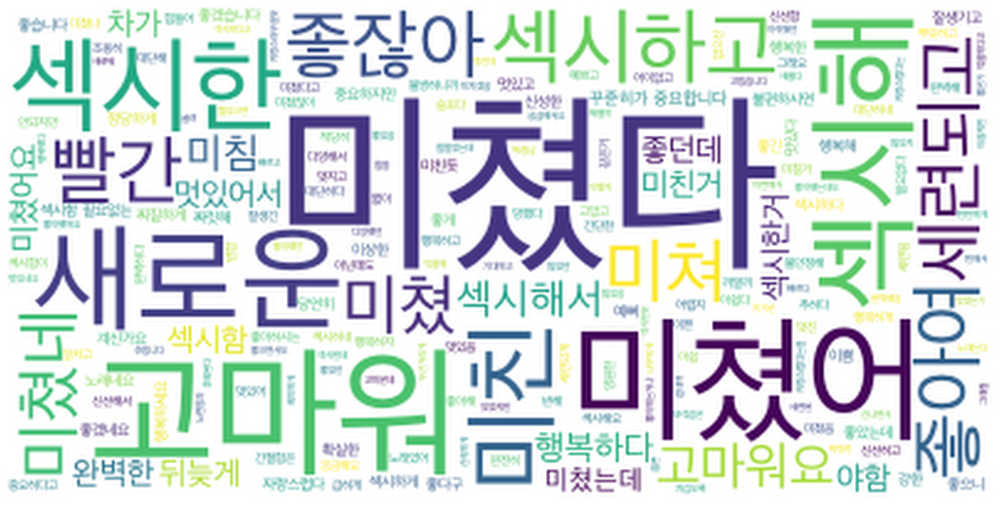

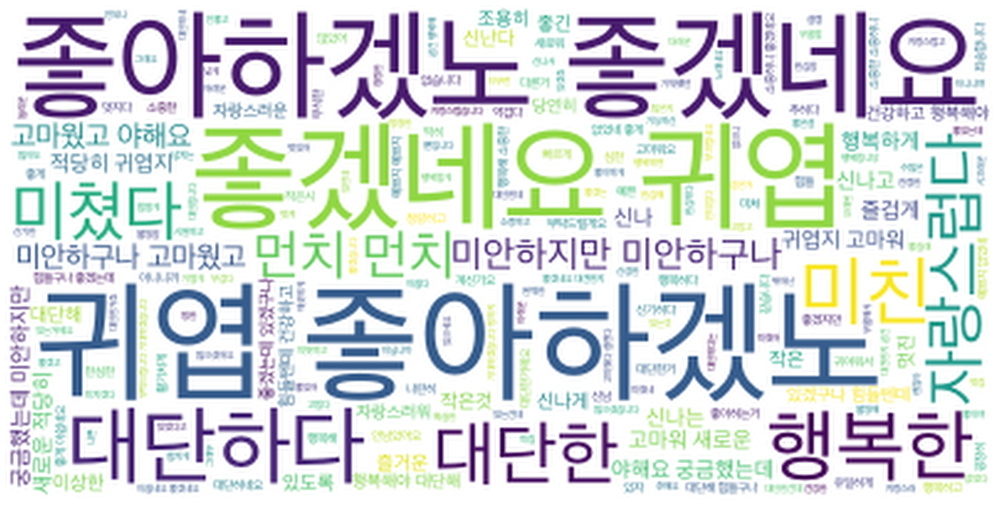

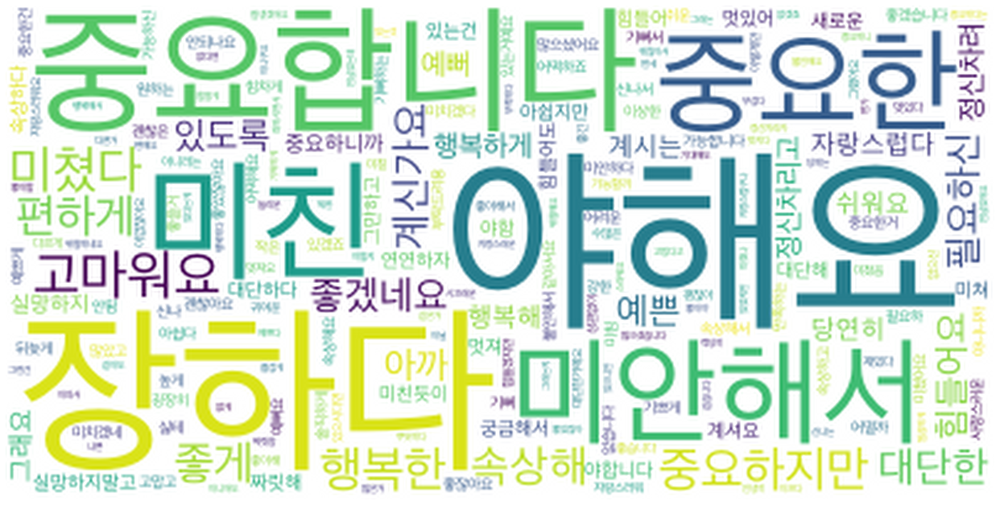

In [8]:
# 워드클라우드 시각화
for i in range(len(text.iloc[:, 2])):
    wordcloud = WordCloud(font_path='./Fonts/AppleSDGothicNeo.ttc', background_color='white').generate(text.iloc[:, 2][i])
    
    output_filename = 'kpop_%dth_wordcloud'%(i+1)
    
    plt.figure(figsize=(22,22)) # 이미지 사이즈 지정
    plt.imshow(wordcloud, interpolation='lanczos') #이미지의 부드럽기 정도
    plt.axis('off') # x, y 축 숫자 제거
    #plt.show() # show 와 savefig 는 공존할 수 없음
    plt.savefig(output_filename)

In [9]:
# 쉼표 제거
for i in range(len(text.iloc[:, 2])):
    text.iloc[:, 2][i] = text.iloc[:, 2][i].replace(',', '')

In [10]:
# 워드클라우드 만든 감정 단어도 엑셀로 만들기
text.to_excel('Melon_WordClouds.xlsx')